# EDA - Sample Sales Data

_ | Details
--- | ---
Task | Perform EDA on [Sample Sales Data](https://www.kaggle.com/kyanyoga/sample-sales-data?select=sales_data_sample.csv)
Owner | kyanyoga
ID | kyanyoga/sample-sales-data
Subtitle | Denormalize Sales Data : Segmentation, Clustering, Shipping, etc.
Description | Sample Sales Data, Order Info, Sales, Customer, Shipping, etc., Used for Segmentation, Customer Analytics, Clustering and More.  Inspired for retail analytics.  This was originally used for Pentaho DI Kettle, But I found the set could be useful for Sales Simulation training. <br><br>Originally Written by María Carina Roldán, Pentaho Community Member, BI consultant (Assert Solutions), Argentina. This work is licensed under the Creative Commons Attribution-Noncommercial-Share Alike 3.0 Unported License.  Modified by Gus Segura June 2014.
License | CC0-1.0

**SETUP**

In [2]:
# !kaggle datasets download -q kyanyoga/sample-sales-data --unzip -f sales_data_sample.csv

In [3]:
# !kaggle datasets metadata kyanyoga/sample-sales-data

In [912]:
import json
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn import preprocessing
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
import scipy.stats
import plotly.figure_factory as ff

In [5]:
# with open('dataset-metadata.json') as metadata:
#     dataset_metadata = json.load(metadata)

In [6]:
filename = 'sales_data_sample.csv'

In [7]:
df = pd.read_csv(filename)

In [10]:
sns.set_theme()

In [278]:
pio.templates.default = "plotly_dark"
px.defaults.template = "plotly_dark"

## Data Preparation

In [ ]:
df.head()

,ORDERNUMBER,QUANTITYORDERED,PRICEEACH,ORDERLINENUMBER,SALES,ORDERDATE,STATUS,QTR_ID,MONTH_ID,YEAR_ID,...,ADDRESSLINE1,ADDRESSLINE2,CITY,STATE,POSTALCODE,COUNTRY,TERRITORY,CONTACTLASTNAME,CONTACTFIRSTNAME,DEALSIZE
0,10107,30,95.70,2,2871.00,2/24/2003 0:00,Shipped,1,2,2003,...,897 Long Airport Avenue,NaN,NYC,NY,10022,USA,NaN,Yu,Kwai,Small
1,10121,34,81.35,5,2765.90,5/7/2003 0:00,Shipped,2,5,2003,...,59 rue de l'Abbaye,NaN,Reims,NaN,51100,France,EMEA,Henriot,Paul,Small
2,10134,41,94.74,2,3884.34,7/1/2003 0:00,Shipped,3,7,2003,...,27 rue du Colonel Pierre Avia,NaN,Paris,NaN,75508,France,EMEA,Da Cunha,Daniel,Medium
3,10145,45,83.26,6,3746.70,8/25/2003 0:00,Shipped,3,8,2003,...,78934 Hillside Dr.,NaN,Pasadena,CA,90003,USA,NaN,Young,Julie,Medium
4,10159,49,100.00,14,5205.27,10/10/2003 0:00,Shipped,4,10,2003,...,7734 Strong St.,NaN,San Francisco,CA,NaN,USA,NaN,Brown,Julie,Medium


### Identifying dataframe details

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2823 entries, 0 to 2822
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ORDERNUMBER       2823 non-null   int64  
 1   QUANTITYORDERED   2823 non-null   int64  
 2   PRICEEACH         2823 non-null   float64
 3   ORDERLINENUMBER   2823 non-null   int64  
 4   SALES             2823 non-null   float64
 5   ORDERDATE         2823 non-null   object 
 6   STATUS            2823 non-null   object 
 7   QTR_ID            2823 non-null   int64  
 8   MONTH_ID          2823 non-null   int64  
 9   YEAR_ID           2823 non-null   int64  
 10  PRODUCTLINE       2823 non-null   object 
 11  MSRP              2823 non-null   int64  
 12  PRODUCTCODE       2823 non-null   object 
 13  CUSTOMERNAME      2823 non-null   object 
 14  PHONE             2823 non-null   object 
 15  ADDRESSLINE1      2823 non-null   object 
 16  ADDRESSLINE2      302 non-null    object 


### Inspecting each variable

In [15]:
df.describe()

,ORDERNUMBER,QUANTITYORDERED,PRICEEACH,ORDERLINENUMBER,SALES,QTR_ID,MONTH_ID,YEAR_ID,MSRP
count,2823.000000,2823.000000,2823.000000,2823.000000,2823.000000,2823.000000,2823.000000,2823.00000,2823.000000
mean,10258.725115,35.092809,83.658544,6.466171,3553.889072,2.717676,7.092455,2003.81509,100.715551
std,92.085478,9.741443,20.174277,4.225841,1841.865106,1.203878,3.656633,0.69967,40.187912
min,10100.000000,6.000000,26.880000,1.000000,482.130000,1.000000,1.000000,2003.00000,33.000000
25%,10180.000000,27.000000,68.860000,3.000000,2203.430000,2.000000,4.000000,2003.00000,68.000000
50%,10262.000000,35.000000,95.700000,6.000000,3184.800000,3.000000,8.000000,2004.00000,99.000000
75%,10333.500000,43.000000,100.000000,9.000000,4508.000000,4.000000,11.000000,2004.00000,124.000000
max,10425.000000,97.000000,100.000000,18.000000,14082.800000,4.000000,12.000000,2005.00000,214.000000


In [16]:
df.describe(include=['O'])

,ORDERDATE,STATUS,PRODUCTLINE,PRODUCTCODE,CUSTOMERNAME,PHONE,ADDRESSLINE1,ADDRESSLINE2,CITY,STATE,POSTALCODE,COUNTRY,TERRITORY,CONTACTLASTNAME,CONTACTFIRSTNAME,DEALSIZE
count,2823,2823,2823,2823,2823,2823,2823,302,2823,1337,2747,2823,1749,2823,2823,2823
unique,252,6,7,109,92,91,92,9,73,16,73,19,3,77,72,3
top,11/14/2003 0:00,Shipped,Classic Cars,S18_3232,Euro Shopping Channel,(91) 555 94 44,"C/ Moralzarzal, 86",Level 3,Madrid,CA,28034,USA,EMEA,Freyre,Diego,Medium
freq,38,2617,967,52,259,259,259,55,304,416,259,1004,1407,259,259,1384


MSRP $\neq$ to PRICEEACH, and therefore might need further inspection

In [17]:
df['PRICE_VAR'] = df.MSRP - df.PRICEEACH

### Customer demographics by Country

In [19]:
df.COUNTRY.value_counts()

USA            1004
Spain           342
France          314
Australia       185
UK              144
Italy           113
Finland          92
Norway           85
Singapore        79
Canada           70
Denmark          63
Germany          62
Sweden           57
Austria          55
Japan            52
Belgium          33
Switzerland      31
Philippines      26
Ireland          16
Name: COUNTRY, dtype: int64

### PRODUCTLINE

In [20]:
print(df.PRODUCTLINE.nunique())
df.PRODUCTLINE.value_counts()

7


Classic Cars        967
Vintage Cars        607
Motorcycles         331
Planes              306
Trucks and Buses    301
Ships               234
Trains               77
Name: PRODUCTLINE, dtype: int64

In [21]:
df[['DEALSIZE', 'PRODUCTLINE', 'PRICEEACH']].groupby(['DEALSIZE', 'PRODUCTLINE'], as_index=True).mean()

PRICEEACH
DEALSIZE PRODUCTLINE                 
Large    Classic Cars       99.874021
         Motorcycles       100.000000
         Planes             97.861111
         Trains            100.000000
         Trucks and Buses  100.000000
         Vintage Cars      100.000000
Medium   Classic Cars       97.015604
         Motorcycles        95.178205
         Planes             90.917674
         Ships              91.541121
         Trains             92.251154
         Trucks and Buses   98.453257
         Vintage Cars       94.112835
Small    Classic Cars       68.669559
         Motorcycles        68.746090
         Planes             73.830893
         Ships              77.380157
         Trains             66.537600
         Trucks and Buses   70.727647
         Vintage Cars       63.579224

### Dataset date coverage

In [22]:
df.YEAR_ID.value_counts()

2004    1345
2003    1000
2005     478
Name: YEAR_ID, dtype: int64

In [23]:
df['ORDERDATE'] = pd.to_datetime(df['ORDERDATE'])

In [24]:
df.reset_index(inplace=True)

In [25]:
df.sort_values(by='ORDERDATE', inplace=True)

In [516]:
def add_zeros(item: str) -> str:
    nums = item.split(":")
    formatted_item = ":".join(f"{int(num):02d}" for num in nums)
    return formatted_item


df['YM_ID'] = pd.concat([df.YEAR_ID.astype('string') + '-' + df.MONTH_ID.astype('string').apply(add_zeros)], join='inner', axis=1)
df['d1'] = '01'
df['YM_ID2'] = pd.concat([df.YEAR_ID.astype('string') + '-' + df.MONTH_ID.astype('string').apply(add_zeros) + '-' + df.d1], join='inner', axis=1)

In [517]:
df.head()

,index,ORDERNUMBER,QUANTITYORDERED,PRICEEACH,ORDERLINENUMBER,SALES,ORDERDATE,STATUS,QTR_ID,MONTH_ID,...,POSTALCODE,COUNTRY,TERRITORY,CONTACTLASTNAME,CONTACTFIRSTNAME,DEALSIZE,PRICE_VAR,YM_ID,d1,YM_ID2
578,578,10100,30,100.00,3,5151.00,2003-01-06,Shipped,1,1,...,62005,USA,NaN,Young,Valarie,Medium,70.00,2003-01,01,2003-01-01
680,680,10100,50,67.80,2,3390.00,2003-01-06,Shipped,1,1,...,62005,USA,NaN,Young,Valarie,Medium,-7.80,2003-01,01,2003-01-01
1267,1267,10100,22,86.51,4,1903.22,2003-01-06,Shipped,1,1,...,62005,USA,NaN,Young,Valarie,Small,5.49,2003-01,01,2003-01-01
2024,2024,10100,49,34.47,1,1689.03,2003-01-06,Shipped,1,1,...,62005,USA,NaN,Young,Valarie,Small,6.53,2003-01,01,2003-01-01
1539,1539,10101,45,31.20,3,1404.00,2003-01-09,Shipped,1,1,...,60528,Germany,EMEA,Keitel,Roland,Small,1.80,2003-01,01,2003-01-01


## Correlations

In [28]:
df.corr()['SALES']

index             -0.335667
ORDERNUMBER        0.039919
QUANTITYORDERED    0.551426
PRICEEACH          0.657841
ORDERLINENUMBER   -0.058400
SALES              1.000000
QTR_ID            -0.006796
MONTH_ID          -0.009605
YEAR_ID            0.035647
MSRP               0.635239
PRICE_VAR          0.400941
Name: SALES, dtype: float64

### Sales Trend

In [622]:
# g = sns.relplot(
#     data=df, x="YM_ID", y="SALES",
#     # hue="DEALSIZE", hue="event", style="event",
#     kind="line", height=6, aspect=2
# )
# g.set_xticklabels(rotation=90, step=1)
# # (g.map(plt.axhline, y=129753.60, color=".7", dashes=(2, 1), zorder=0))

In [241]:
# g = sns.relplot(
#     data=df, x="YM_ID", y="SALES",
#     # hue="DEALSIZE", hue="event", style="event",
#     kind="line", height=6, aspect=2, estimator=sum
# )
# g.set_xticklabels(rotation=90, step=1)
# # (g.map(plt.axhline, y=129753.60, color=".7", dashes=(2, 1), zorder=0))

In [242]:
# fig = px.histogram(data_frame=df, x='ORDERDATE', y='SALES', histfunc='avg',
#                    color='DEALSIZE', category_orders={'DEALSIZE': ['Small', 'Medium', 'Large']},
#                    opacity=1)
# # fig.update_traces(xbins_size="M1")
# fig.update_xaxes(showgrid=True, ticklabelmode="period",
#                  # dtick="M1",
#                  # tickformat="%b\n%Y"
#                  )
# fig.update_layout(bargap=0.1)
# # fig.add_trace(go.Scatter(mode="markers", x=df["ORDERDATE"], y=df["SALES"], name="daily"))
# fig.show()

In [243]:
# fig = go.Figure(data=[go.Scatter(x=df.ORDERDATE, y=df.SALES)])

# fig.show()

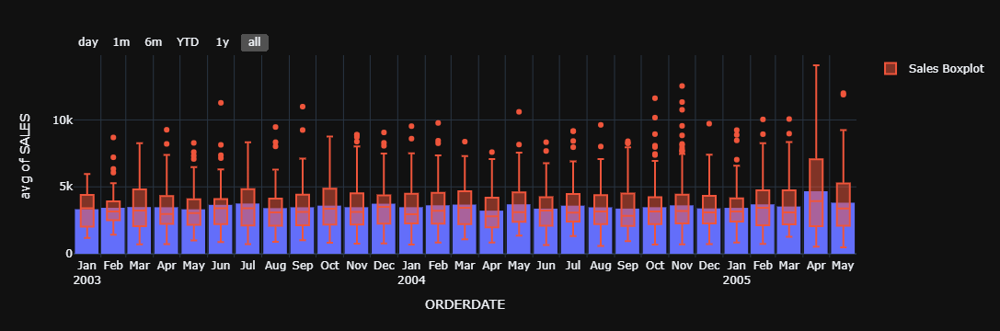

In [1661]:
fig = px.histogram(data_frame=df, x='ORDERDATE', y='SALES', histfunc='avg',
                   # color='DEALSIZE', category_orders={'DEALSIZE': ['Small', 'Medium', 'Large']},
                   opacity=1)
fig.update_traces(xbins_size="M1")
fig.update_xaxes(showgrid=True, ticklabelmode="period",
                 dtick="M1",
                 tickformat="%b\n%Y",
                 rangeselector=dict(
                     bgcolor='#111111',
                     buttons=list([
                         dict(count=1, label="day", step="month", stepmode="backward"),
                         dict(count=1, label="1m", step="month", stepmode="backward"),
                         dict(count=6, label="6m", step="month", stepmode="backward"),
                         dict(count=1, label="YTD", step="year", stepmode="todate"),
                         dict(count=1, label="1y", step="year", stepmode="backward"),
                         dict(step="all")
                     ])
                 ))
fig.update_layout(bargap=0.1)

fig.add_trace(go.Box(
    name="Sales Boxplot",
    xperiod="M1",
    # mode="markers+lines",
    x=df.ORDERDATE, y=df.SALES,
))

# fig.add_volume(x=df.SALES)

fig.show()

In [525]:
sum_df = df[['YM_ID2', 'ORDERDATE', 'YEAR_ID', 'MONTH_ID', 'SALES']].groupby(['YM_ID2', 'YEAR_ID', 'MONTH_ID'], as_index=False).sum()
sum_df.head()

,YM_ID2,YEAR_ID,MONTH_ID,SALES
0,2003-01-01,2003,1,129753.60
1,2003-02-01,2003,2,140836.19
2,2003-03-01,2003,3,174504.90
3,2003-04-01,2003,4,201609.55
4,2003-05-01,2003,5,192673.11


In [1663]:
# # Create figure with secondary y-axis
# fig = make_subplots(specs=[[{"secondary_y": True}]])

# # include Histogram for Avg. Sales
# fig.add_trace(go.Histogram(x=df.ORDERDATE, y=df.SALES, histfunc='avg', opacity=.7, name='Avg. Sales', marker_color='#EB89B5',
#                            xbins=dict(start=df.ORDERDATE.min() - np.timedelta64(10, 'D'),
#                                       end=df.ORDERDATE.max() + np.timedelta64(2, 'D'),
#                                       # size=size_x
#                                       )
#                            ),
#               secondary_y=True)

# # include a go.Histogram trace for Total Sales
# fig.add_trace(go.Histogram(x=df.ORDERDATE, y=df.SALES, histfunc='sum', opacity=.8, name='Total Sales', marker_color='#520ec2',
#                            xbins=dict(start=df.ORDERDATE.min() - np.timedelta64(2, 'D'),
#                                       end=df.ORDERDATE.max() + np.timedelta64(10, 'D'),
#                                       # size=size_x
#                                       )
#                            ),
#               secondary_y=False)

# # fig.add_trace(go.Scatter(x=sum_df.YM_ID2, y=sum_df.SALES,
# #                          mode='markers', name="Total Sales",
# #                          xperiod="M1", xperiodalignment="middle",
# #                          opacity=.7
# #                          ), secondary_y=True)

# fig.update_xaxes(showgrid=True, ticklabelmode="period",
#                  dtick="M1",
#                  tickformat="%b\n%Y",
#                  rangeselector=dict(
#                      bgcolor='#111111',
#                      buttons=list([
#                          dict(count=1, label="day", step="month", stepmode="backward"),
#                          dict(count=1, label="1m", step="month", stepmode="backward"),
#                          dict(count=6, label="6m", step="month", stepmode="backward"),
#                          dict(count=1, label="YTD", step="year", stepmode="todate"),
#                          dict(count=1, label="1y", step="year", stepmode="backward"),
#                          dict(step="all")
#                      ])
#                  ))

# fig.update_layout(bargap=0.4, width=800)

# fig.layout.yaxis2.showgrid = False

# # setup for error bars
# # fig.update_traces(xbins_size="M1",
# #                   error_y_array=df.SALES,
# #                   # error_y_color='#00FF00',
# #                   error_y_color='limegreen',
# #                   selector=dict(type='histogram',
# #                                 name='Avg. Sales'
# #                                 ))

# fig.update_traces(xbins_size="M1")
# fig.show()

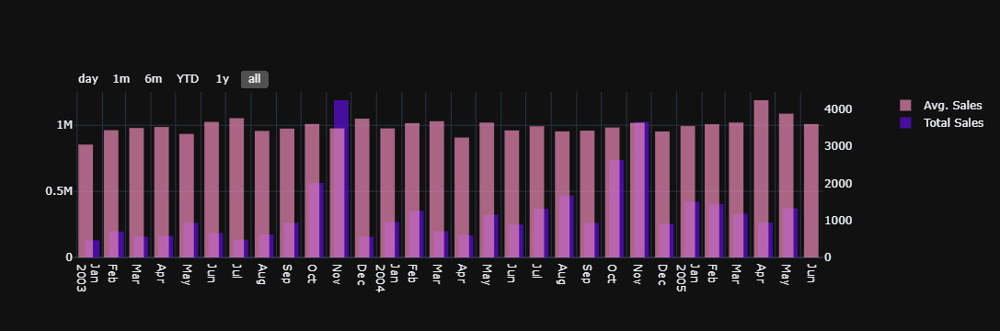

In [1664]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# include Histogram for Avg. Sales
fig.add_trace(go.Histogram(x=df.ORDERDATE, y=df.SALES, histfunc='avg', opacity=.7, name='Avg. Sales', marker_color='#EB89B5',
                           xbins=dict(start=df.ORDERDATE.min() - np.timedelta64(10, 'D'),
                                      end=df.ORDERDATE.max() + np.timedelta64(2, 'D'),
                                      # size=size_x
                                      )
                           ),
              secondary_y=True)

# include a go.Histogram trace for Total Sales
fig.add_trace(go.Histogram(x=df.ORDERDATE, y=df.SALES, histfunc='sum', opacity=.8, name='Total Sales', marker_color='#520ec2',
                           xbins=dict(start=df.ORDERDATE.min() - np.timedelta64(2, 'D'),
                                      end=df.ORDERDATE.max() + np.timedelta64(10, 'D'),
                                      # size=size_x
                                      )
                           ),
              secondary_y=False)

fig.update_xaxes(showgrid=True, ticklabelmode="period",
                 dtick="M1",
                 tickformat="%b\n%Y",
                 rangeselector=dict(
                     bgcolor='#111111',
                     buttons=list([
                         dict(count=1, label="day", step="month", stepmode="backward"),
                         dict(count=1, label="1m", step="month", stepmode="backward"),
                         dict(count=6, label="6m", step="month", stepmode="backward"),
                         dict(count=1, label="YTD", step="year", stepmode="todate"),
                         dict(count=1, label="1y", step="year", stepmode="backward"),
                         dict(step="all")
                     ])
                 ))
fig.layout.yaxis2.showgrid = False
fig.update_layout(bargap=0.4, width=800)
fig.update_traces(xbins_size="M1")
fig.show()

Calculate CIs

In [1286]:
# Function to calculate the confidence interval
def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h


ci = df.groupby(by=['YM_ID2']).SALES.apply(mean_confidence_interval)

In [809]:
m = []
mmh = []
mph = []
for elem in ci:
    m.append(elem[0])
    mmh.append(elem[1])
    mph.append(elem[2])

In [825]:
new_df = df[['YM_ID']].groupby('YM_ID').count()
new_df.reset_index(inplace=True)
new_df.reset_index(inplace=True)
new_df['s1'] = df[['YEAR_ID', 'MONTH_ID', 'SALES']].groupby(['YEAR_ID', 'MONTH_ID'], as_index=False).sum().to_numpy()[:, 2]
new_df['s2'] = df[['YEAR_ID', 'MONTH_ID', 'SALES']].groupby(['YEAR_ID', 'MONTH_ID'], as_index=False).mean().to_numpy()[:, 2]
new_df['s3'] = df[['YEAR_ID', 'MONTH_ID', 'SALES']].groupby(['YEAR_ID', 'MONTH_ID'], as_index=False).std().to_numpy()[:, 2]
new_df['s4'] = m
new_df['s5'] = mmh
new_df['s6'] = mph
# new_df
long_df = pd.wide_to_long(new_df, 's', i='index', j='YM_ID')
long_df.rename(columns={'YM_ID': 'YM', 's': 'amount'}, inplace=True)
long_df.reset_index(inplace=True)
long_df.rename(columns={'YM_ID': 'variable_type'}, inplace=True)
long_df.variable_type.replace(to_replace=1, value='total_sales', inplace=True)
long_df.variable_type.replace(to_replace=2, value='avg_sales', inplace=True)
long_df.variable_type.replace(to_replace=3, value='std', inplace=True)
long_df.variable_type.replace(to_replace=4, value='mean', inplace=True)
long_df.variable_type.replace(to_replace=5, value='m-h', inplace=True)
long_df.variable_type.replace(to_replace=6, value='m+h', inplace=True)
long_df.drop('index', axis=1, inplace=True)
long_df.head(2)

,variable_type,YM,amount
0,total_sales,2003-01,129753.60
1,total_sales,2003-02,140836.19


In [1665]:
# g = sns.relplot(
#     data=long_df.query('variable_type != "std"'), x="YM", y="amount",
#     hue="variable_type",  # col_wrap=2, hue="event", style="event",
#     kind="line", height=6, aspect=2
# )
# g.set_xticklabels(rotation=90, step=1)

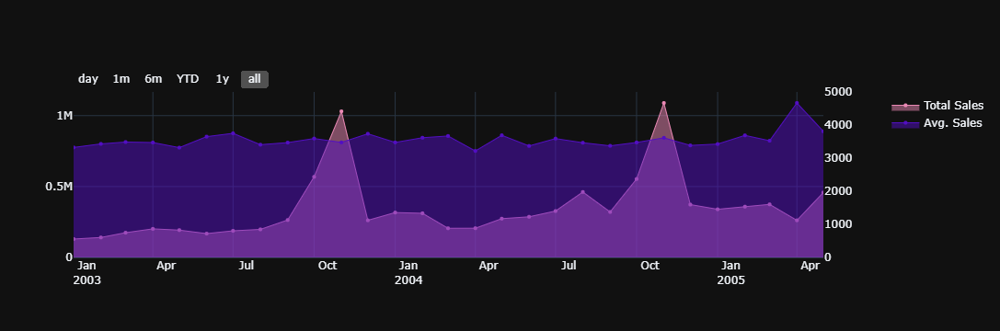

In [1666]:
# Create figure with secondary y-axis

fig = make_subplots(specs=[[{"secondary_y": True}]])

# include Scatter with total_sales
fig.add_trace(go.Scatter(x=long_df.YM, y=long_df['amount'][long_df.variable_type == 'total_sales'],
                         mode='markers+lines', marker_color='#EB89B5',
                         fill='tozeroy', opacity=1,
                         name='Total Sales', ),
              secondary_y=False)

# include a go.Scatter trace for avg_sales
fig.add_trace(go.Scatter(x=long_df.YM, y=long_df['amount'][long_df.variable_type == 'avg_sales'],
                         mode='markers+lines', marker_color='#520ec2',
                         fill='tozeroy', opacity=1,
                         name='Avg. Sales'),
              secondary_y=True)

fig.update_xaxes(showgrid=True, ticklabelmode="period",
                 # dtick="M1",
                 tickformat="%b\n%Y",
                 rangeselector=dict(
                     bgcolor='#111111',
                     buttons=list([
                         dict(count=1, label="day", step="month", stepmode="backward"),
                         dict(count=1, label="1m", step="month", stepmode="backward"),
                         dict(count=6, label="6m", step="month", stepmode="backward"),
                         dict(count=1, label="YTD", step="year", stepmode="todate"),
                         dict(count=1, label="1y", step="year", stepmode="backward"),
                         dict(step="all")
                     ])
                 ))

fig.update_traces(marker_size=4, selector=dict(type='scatter'),
                  line_shape='linear', line_width=1
                  )

fig.layout.yaxis.exponentformat = 'B'
fig.layout.yaxis2.showgrid = False
fig.show()

In [839]:
# g = sns.catplot(
#     data=df, x="YM_ID", y="SALES",
#     # hue="DEALSIZE",
#     # col_wrap=2, hue="event", style="event",
#     kind="point", height=6, aspect=2
# )
# g.set_xticklabels(rotation=90, step=1)

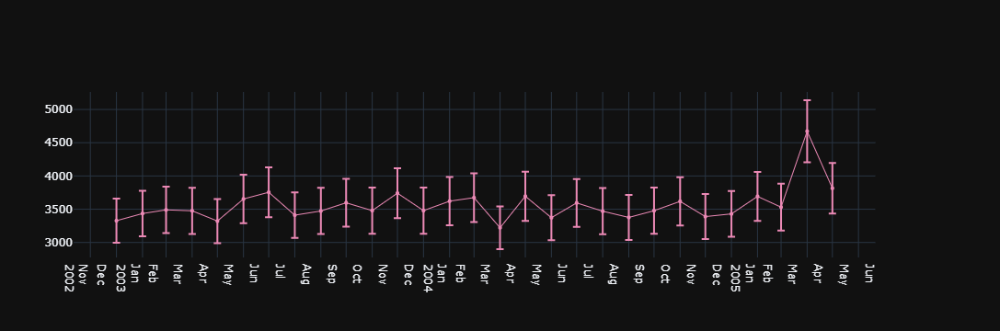

In [1667]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(go.Scatter(x=long_df.YM, y=long_df['amount'][long_df.variable_type == 'avg_sales'],
                         mode='markers+lines', marker_color='#EB89B5',
                         # fill='tozeroy', opacity=1,
                         error_y=dict(
                             type='percent',
                             symmetric=False,
                             array=long_df['amount'][long_df.variable_type == 'm+h'],
                             arrayminus=long_df['amount'][long_df.variable_type == 'm-h']),
                         name='Avg. Sales'),
              secondary_y=False)

fig.update_xaxes(showgrid=True, ticklabelmode="period",
                 dtick="M1",
                 tickformat="%b\n%Y")

fig.update_traces(marker_size=4, selector=dict(type='scatter'),
                  line_shape='linear', line_width=1
                  )

fig.layout.yaxis.exponentformat = 'E'
fig.layout.yaxis2.showgrid = False
fig.show()

### Inspecting Initial Relationships (numeric)

Notes:
* Seasons (e.g., year, month) have little to no correlation with sales
* Inspect variables: QUANTITYORDERED, PRICEEACH, MSRP, PRICE_VAR
* Appearance of relationship between `DEALSIZE` and `PRICE_VAR`
  * Where `PRICE_VAR = MSRP - PRICEEACH`
  * Does `PRICE_VAR` $\propto$ `SALES`?
    * I.e., as `PRICE_VAR` increases, which is caused by the sellers reducing the item price (i.e., discounts reducing `PRICEEACH`), does SALES increase?

In [277]:
df.corr()['SALES']

index             -0.335667
ORDERNUMBER        0.039919
QUANTITYORDERED    0.551426
PRICEEACH          0.657841
ORDERLINENUMBER   -0.058400
SALES              1.000000
QTR_ID            -0.006796
MONTH_ID          -0.009605
YEAR_ID            0.035647
MSRP               0.635239
PRICE_VAR          0.400941
Name: SALES, dtype: float64

In [1138]:
# sns.heatmap(df[['SALES', 'MSRP', 'QUANTITYORDERED', 'PRICEEACH', 'PRICE_VAR']].corr())

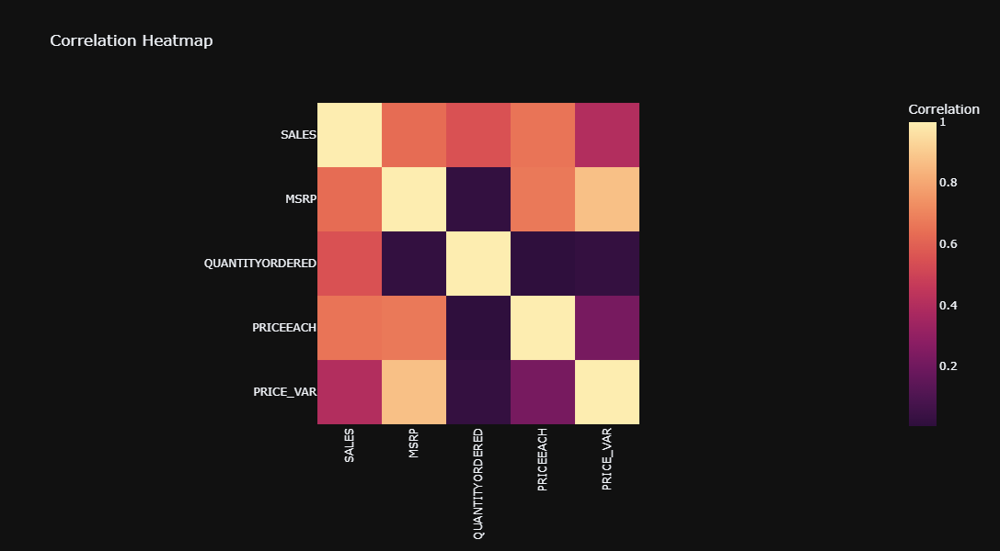

In [1136]:
corr_df = df[['SALES', 'MSRP', 'QUANTITYORDERED', 'PRICEEACH', 'PRICE_VAR']].corr()

z = corr_df.to_numpy()
z_text = np.around(z, decimals=2)  # Only show rounded value (full value on hover)

x = corr_df.columns.to_list()
y = corr_df.columns.to_list()

fig = px.imshow(z, x=x, y=y,
                title='Correlation Heatmap',
                labels=dict(
                    # x="Day of Week",
                    # y="Time of Day",
                    color="Correlation"),
                color_continuous_scale='Matter_r',
                width=600, height=600,
                )
# fig.update_xaxes(side="top")
fig.update_xaxes(tickangle=-90)
fig.show()

In [1062]:
# Alternative correlations heatmap
# fig = ff.create_annotated_heatmap(z, x=x, y=y,
#                                   showscale=True,
#                                   annotation_text=z_text,
#                                   reversescale=True,
#                                   # colorscale='Viridis'
#                                   colorscale='matter'
#                                   )

# # fig.update_xaxes(tickangle=-90)
# fig.update_traces(colorbar_tickwidth=500, selector=dict(type='histogram2d'))
# fig.update_layout(title_text='Correlations heatmap')

# # Make text size smaller
# for i in range(len(fig.layout.annotations)):
#     fig.layout.annotations[i].font.size = 12

# fig.show()

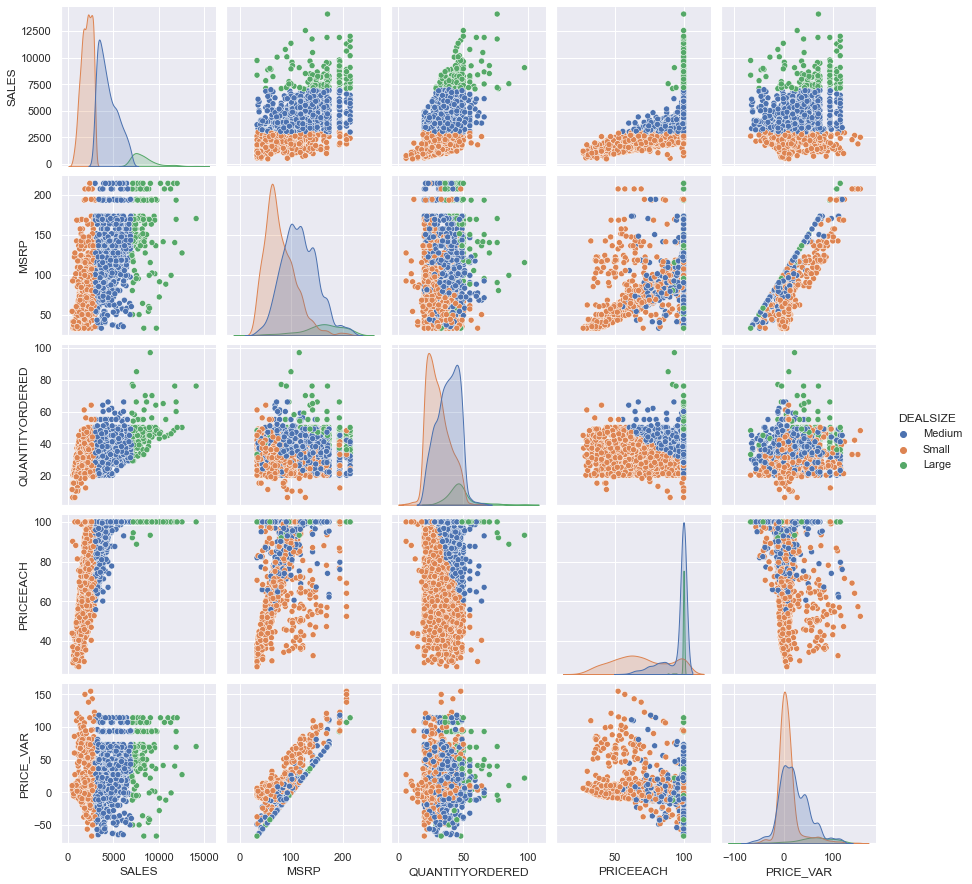

In [288]:
sns.pairplot(data=df[['SALES', 'MSRP', 'QUANTITYORDERED', 'PRICEEACH', 'PRICE_VAR', 'DEALSIZE']], hue="DEALSIZE")

#### MSRP (T)

In [1668]:
# sns.regplot(x='MSRP', y='SALES', data=df)

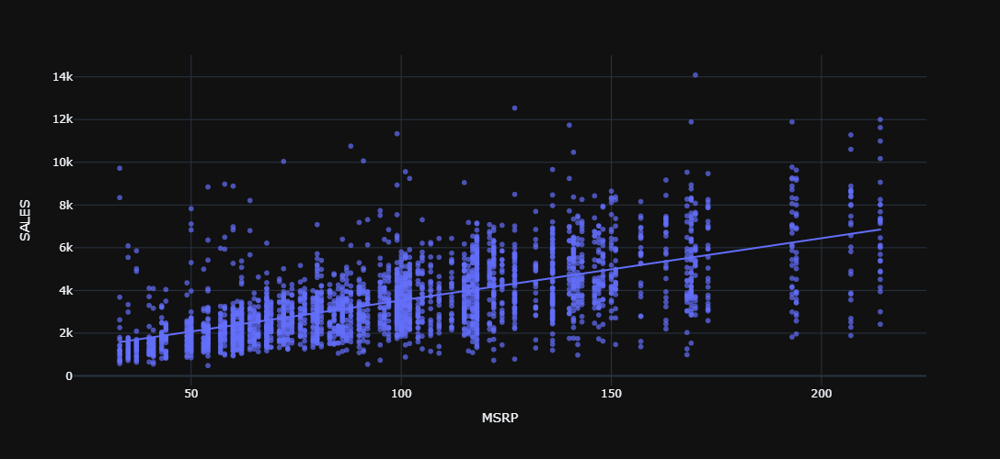

In [1068]:
fig = px.scatter(df, x="MSRP", y="SALES", trendline="ols", opacity=.7, width=600, height=500)
fig.show()

In [1072]:
# sns.jointplot(x='MSRP', y='SALES', data=df, hue='DEALSIZE')

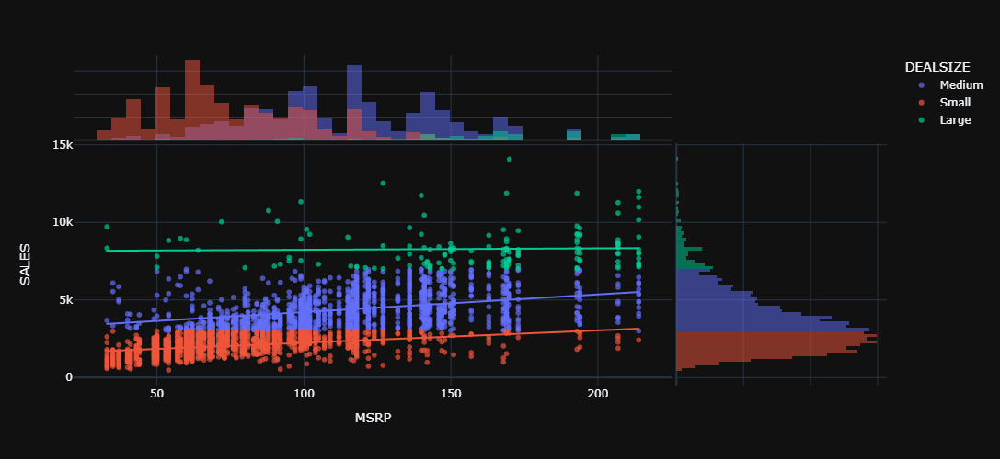

In [1071]:
fig = px.scatter(df, x="MSRP", y="SALES", trendline="ols",
                 opacity=.7, color="DEALSIZE",
                 marginal_x="histogram", marginal_y="histogram",
                 width=600, height=500)
fig.show()

#### PRICEEACH (T)

In [1074]:
# sns.regplot(x='PRICEEACH', y='SALES', data=df)

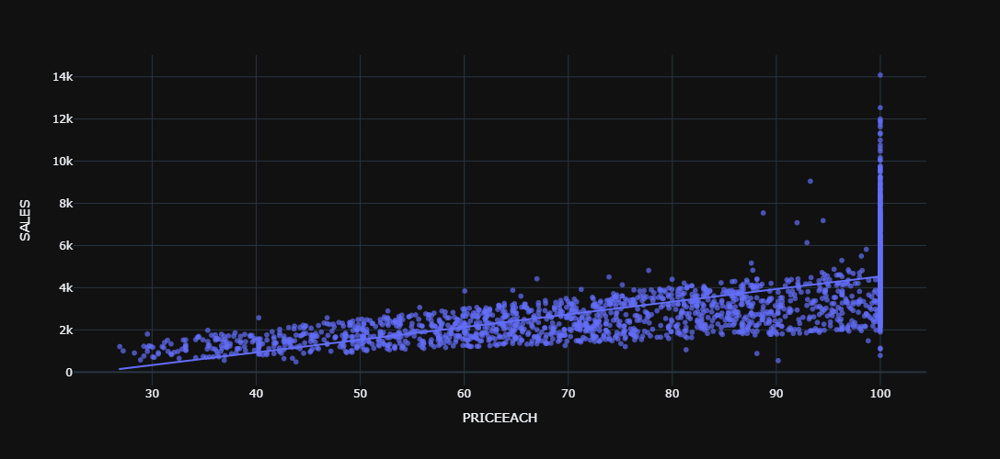

In [1073]:
fig = px.scatter(df, x="PRICEEACH", y="SALES", trendline="ols",
                 opacity=.7,
                 # color="DEALSIZE", marginal_x="histogram", marginal_y="histogram",
                 width=600, height=500)
fig.show()

In [1076]:
# sns.jointplot(x='PRICEEACH', y='SALES', data=df, hue='DEALSIZE')

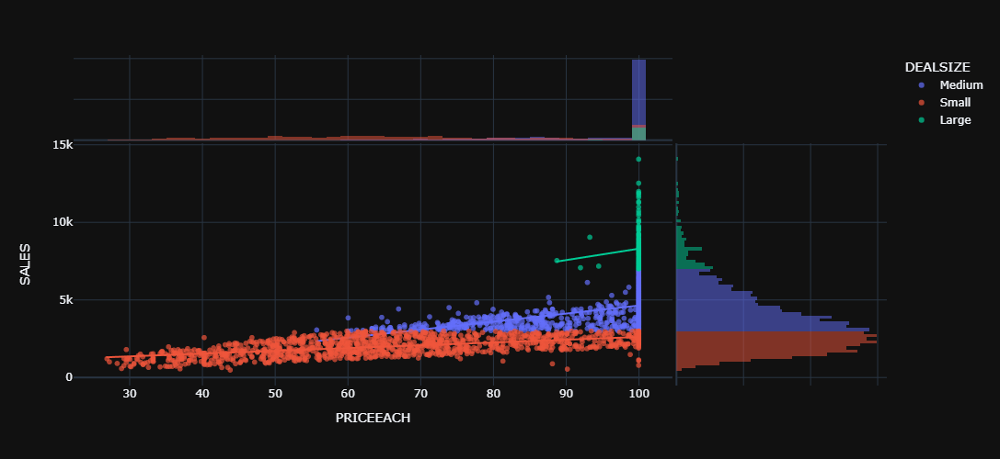

In [1075]:
fig = px.scatter(df, x="PRICEEACH", y="SALES", trendline="ols",
                 opacity=.7,
                 color="DEALSIZE", marginal_x="histogram", marginal_y="histogram",
                 width=600, height=500)
fig.show()

#### PRICE_VAR (T)

In [1078]:
# sns.jointplot(data=df, x="PRICE_VAR", y="SALES", kind='reg')

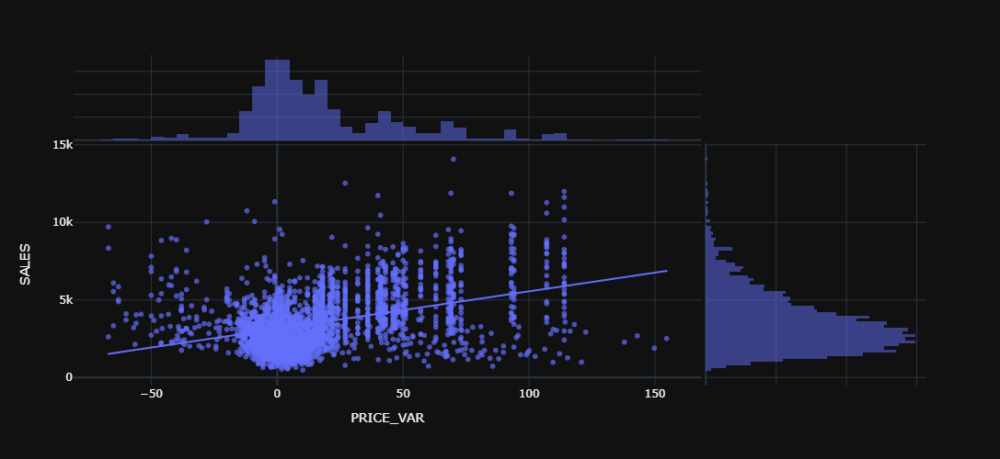

In [1077]:
fig = px.scatter(df, x="PRICE_VAR", y="SALES", trendline="ols",
                 opacity=.7,
                 # color="DEALSIZE",
                 marginal_x="histogram", marginal_y="histogram",
                 width=600, height=500)
fig.show()

In [1080]:
# sns.jointplot(data=df, x="PRICE_VAR", y="SALES", hue="DEALSIZE")

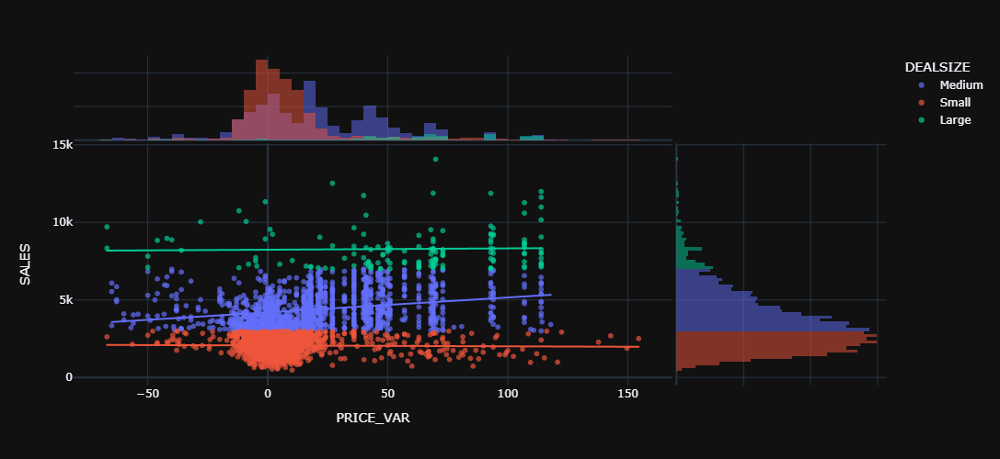

In [1079]:
fig = px.scatter(df, x="PRICE_VAR", y="SALES", trendline="ols",
                 opacity=.7,
                 color="DEALSIZE",
                 marginal_x="histogram", marginal_y="histogram",
                 width=600, height=500)
fig.show()

In [1096]:
# sns.boxplot(x='PRICE_VAR', y='DEALSIZE', order=['Large', 'Medium', 'Small'], data=df)

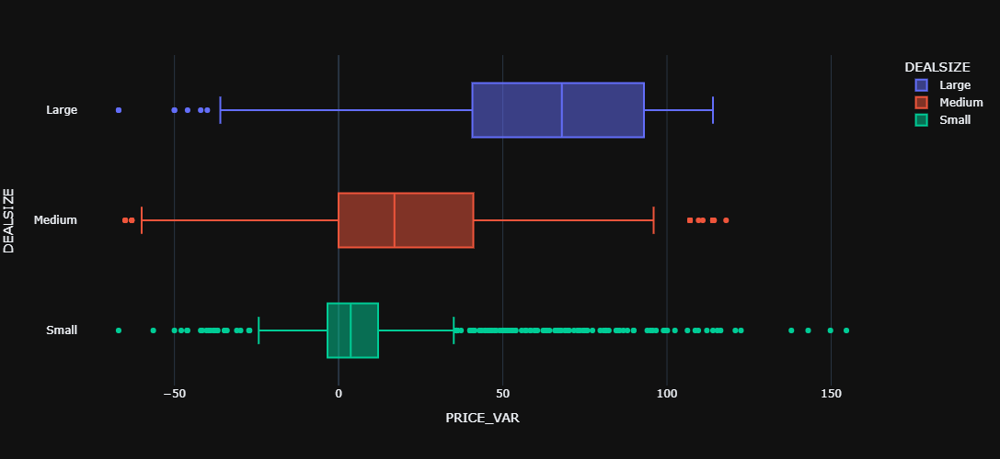

In [1095]:
fig = px.box(df, x="PRICE_VAR", y="DEALSIZE", color="DEALSIZE",
             # points="all",
             category_orders={'DEALSIZE': ['Large', 'Medium', 'Small']},
             width=600, height=500)
fig.update_traces(quartilemethod="linear")  # or "inclusive", or "linear" by default
fig.show()

#### QUANTITYORDERED (T)

In [309]:
df[['SALES', 'QUANTITYORDERED']].corr()['SALES']

SALES              1.000000
QUANTITYORDERED    0.551426
Name: SALES, dtype: float64

In [1669]:
# sns.regplot(y='SALES', x='QUANTITYORDERED', data=df)

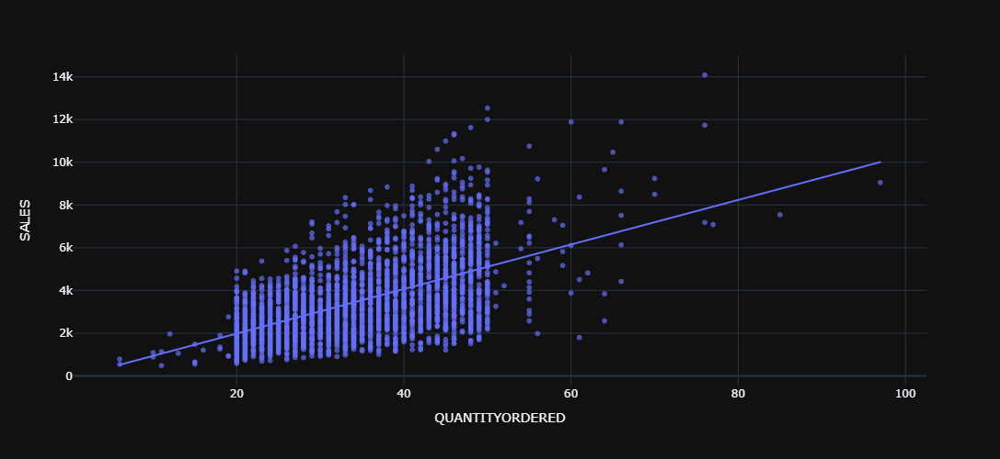

In [1097]:
fig = px.scatter(df, x="QUANTITYORDERED", y="SALES", trendline="ols",
                 opacity=.7,
                 # color="DEALSIZE",
                 # marginal_x="histogram", marginal_y="histogram",
                 width=600, height=500)
fig.show()

Inspecting QUANTITYORDERED relationships with other variables:
> DEALSIZE

In [1110]:
# sns.boxplot(x='QUANTITYORDERED', y='DEALSIZE', order=['Large', 'Medium', 'Small'], data=df)

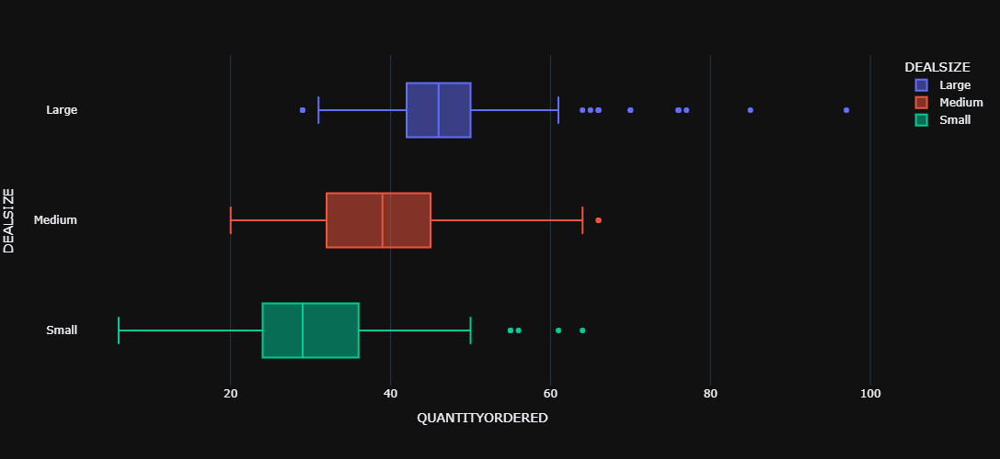

In [1098]:
fig = px.box(df, x="QUANTITYORDERED", y="DEALSIZE", color="DEALSIZE",
             # points="all",
             category_orders={'DEALSIZE': ['Large', 'Medium', 'Small']},
             width=600, height=500)
fig.update_traces(quartilemethod="linear")  # or "inclusive", or "linear" by default
fig.show()

> PRICE_VAR

In [1101]:
# sns.regplot(x='PRICE_VAR', y='QUANTITYORDERED', data=df)

In [1107]:
corr_df.PRICE_VAR

SALES              0.400941
MSRP               0.871998
QUANTITYORDERED    0.019834
PRICEEACH          0.221666
PRICE_VAR          1.000000
Name: PRICE_VAR, dtype: float64

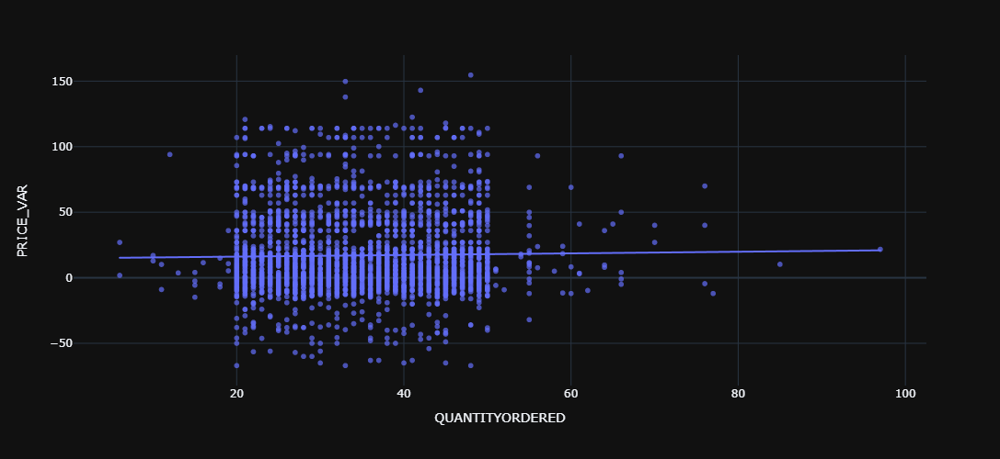

In [1100]:
fig = px.scatter(df, x="QUANTITYORDERED", y="PRICE_VAR", trendline="ols",
                 opacity=.7,
                 # color="DEALSIZE",
                 # marginal_x="histogram", marginal_y="histogram",
                 width=600, height=500)
fig.show()

In [1114]:
# sns.scatterplot(x='PRICE_VAR', y='QUANTITYORDERED', hue='DEALSIZE', data=df)

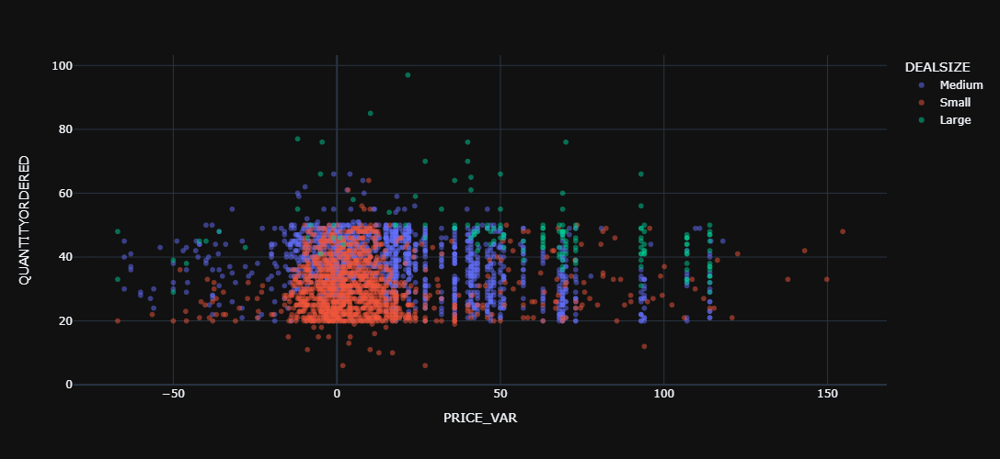

In [1115]:
fig = px.scatter(df, y="QUANTITYORDERED", x="PRICE_VAR",
                 # trendline="ols",
                 opacity=.5,
                 color="DEALSIZE",
                 # marginal_x="histogram", marginal_y="histogram",
                 width=600, height=500)
fig.show()

### `LabelEncoder()`

> Subheadings below will show True (T) if the correlation value between SALES and each respective variable shows the likelihood of a relationship, and False (F) if not.

In [473]:
df[['DEALSIZE', 'PRODUCTLINE', 'PRODUCTCODE']].nunique()

DEALSIZE         3
PRODUCTLINE      7
PRODUCTCODE    109
dtype: int64

In [1185]:
norm_df = df[['SALES', 'MSRP', 'PRICEEACH', 'PRICE_VAR', 'QUANTITYORDERED', 'DEALSIZE', 'PRODUCTLINE', 'PRODUCTCODE']].copy()

# DEALSIZE
le_dealsize = preprocessing.LabelEncoder()
le_dealsize.fit(['Large', 'Medium', 'Small'])  # OUTPUT: {'Large': 0, 'Medium': 1, 'Small': 2}
norm_df['DEALSIZE'] = le_dealsize.transform(norm_df['DEALSIZE'])

# PRODUCTLINE
le_productline = preprocessing.LabelEncoder()
product_lines = list(set(df.PRODUCTLINE))
le_productline.fit(product_lines)
norm_df['PRODUCTLINE'] = le_productline.transform(norm_df['PRODUCTLINE'])

# PRODUCTCODE
le_productcode = preprocessing.LabelEncoder()
product_codes = list(set(df.PRODUCTCODE))
le_productcode.fit(product_codes)
norm_df['PRODUCTCODE'] = le_productcode.transform(norm_df['PRODUCTCODE'])
norm_df.corr()

,SALES,MSRP,PRICEEACH,PRICE_VAR,QUANTITYORDERED,DEALSIZE,PRODUCTLINE,PRODUCTCODE
SALES,1.000000,0.635239,0.657841,0.400941,0.551426,-0.862814,-0.160354,-0.335955
MSRP,0.635239,1.000000,0.670625,0.871998,0.017881,-0.580248,-0.279994,-0.544184
PRICEEACH,0.657841,0.670625,1.000000,0.221666,0.005564,-0.630426,-0.130841,-0.276001
PRICE_VAR,0.400941,0.871998,0.221666,1.000000,0.019834,-0.346744,-0.281722,-0.533221
QUANTITYORDERED,0.551426,0.017881,0.005564,0.019834,1.000000,-0.476389,-0.007752,-0.005400
DEALSIZE,-0.862814,-0.580248,-0.630426,-0.346744,-0.476389,1.000000,0.136536,0.300693
PRODUCTLINE,-0.160354,-0.279994,-0.130841,-0.281722,-0.007752,0.136536,1.000000,0.124035
PRODUCTCODE,-0.335955,-0.544184,-0.276001,-0.533221,-0.005400,0.300693,0.124035,1.000000


In [1139]:
# sns.heatmap(norm_df.corr())

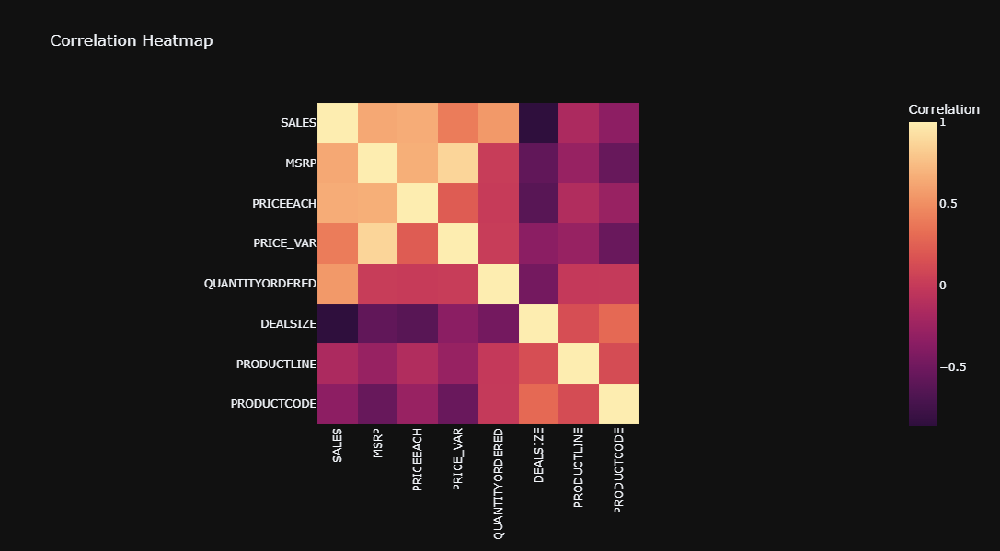

In [1133]:
z = norm_df.corr().to_numpy()
z_text = np.around(z, decimals=2)  # Only show rounded value (full value on hover)

x = norm_df.corr().columns.to_list()
y = norm_df.corr().columns.to_list()

fig = px.imshow(z, x=x, y=y,
                title='Correlation Heatmap',
                labels=dict(
                    # x="Day of Week",
                    # y="Time of Day",
                    color="Correlation"),
                color_continuous_scale='Matter_r',
                width=600, height=600,
                )
# fig.update_xaxes(side="top")
fig.update_xaxes(tickangle=-90)
fig.show()

#### DEALSIZE (T)

In [1152]:
# sns.boxplot(x='SALES', y='DEALSIZE', order=['Large', 'Medium', 'Small'], data=df)

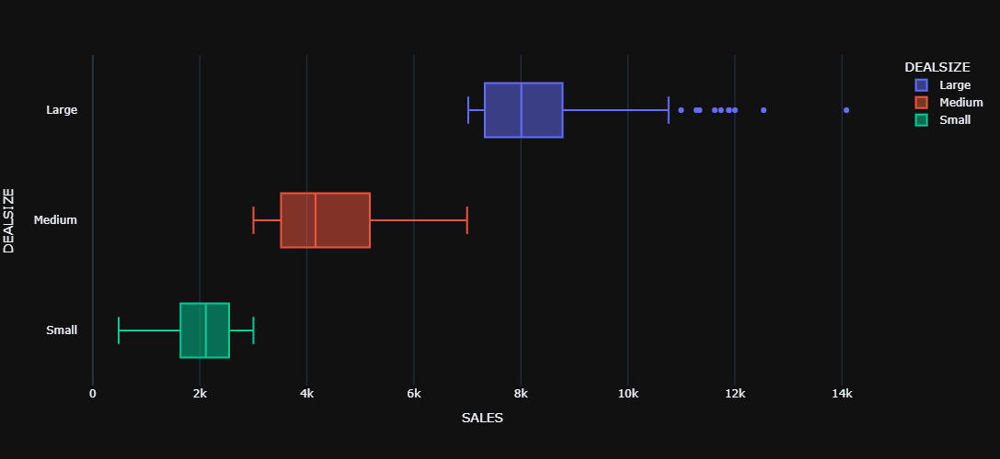

In [1150]:
fig = px.box(df, x="SALES", y="DEALSIZE", color="DEALSIZE",
             category_orders={'DEALSIZE': ['Large', 'Medium', 'Small']},
             points='outliers',  # outliers, false, all
             # marginal_x="histogram", marginal_y="histogram",
             width=600, height=500)
fig.update_traces(quartilemethod="linear")  # or "inclusive", or "linear" by default
fig.show()

In [1151]:
# sns.boxplot(x='PRICE_VAR', y='DEALSIZE', order=['Large', 'Medium', 'Small'], data=df)

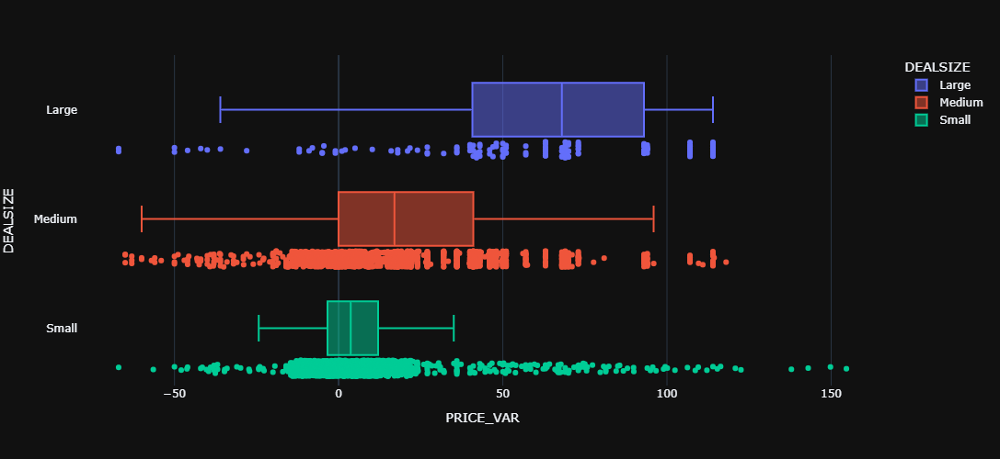

In [1175]:
fig = px.box(df, x="PRICE_VAR", y="DEALSIZE", color="DEALSIZE",
             category_orders={'DEALSIZE': ['Large', 'Medium', 'Small']},
             points='all',  # outliers, false, all
             # marginal_x="histogram", marginal_y="histogram",
             width=600, height=500)
fig.update_traces(quartilemethod="linear")  # or "inclusive", or "linear" by default
fig.show()

In [1177]:
# sns.stripplot(x='PRICE_VAR', y='DEALSIZE', order=['Large', 'Medium', 'Small'], data=df)

In [1195]:
# sns.regplot(y='DEALSIZE', x='QUANTITYORDERED', data=norm_df)

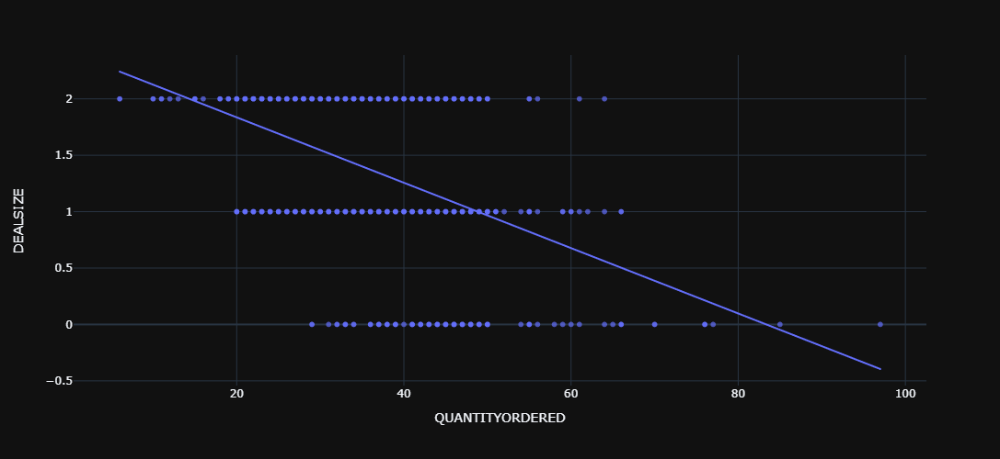

In [1194]:
fig = px.scatter(norm_df, x='QUANTITYORDERED', y='DEALSIZE', trendline='ols', opacity=0.7,
                 width=500, height=500)
fig.show()

#### PRODUCTLINE (F)

In [1204]:
# g = sns.catplot(y='PRODUCTLINE', data=df, kind='count', aspect=1.4)
# g.set_xticklabels(rotation=90, step=1)

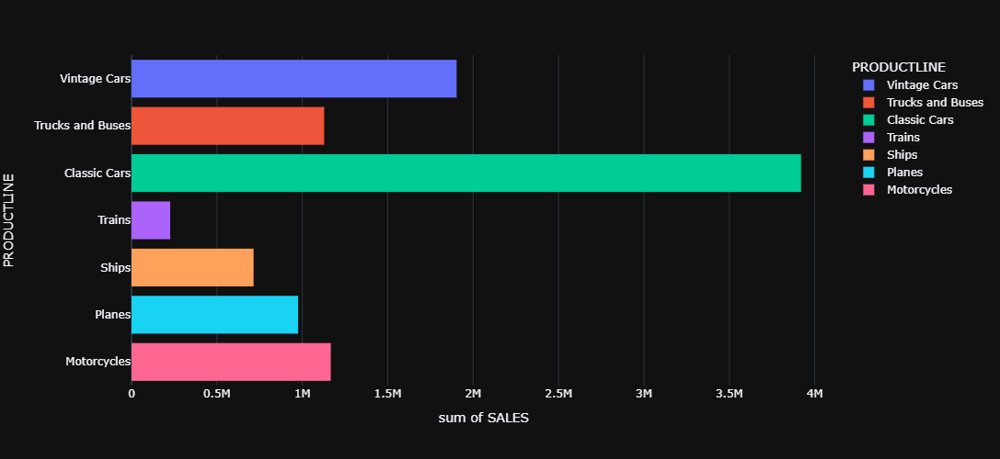

In [ ]:
fig = px.histogram(df, x="SALES", y="PRODUCTLINE", color="PRODUCTLINE",
                   width=800, height=500)
fig.show()

In [1200]:
# g = sns.catplot(y='PRODUCTLINE', x='SALES', data=df, kind='box', aspect=1.4)
# g.set_xticklabels(rotation=90, step=1)

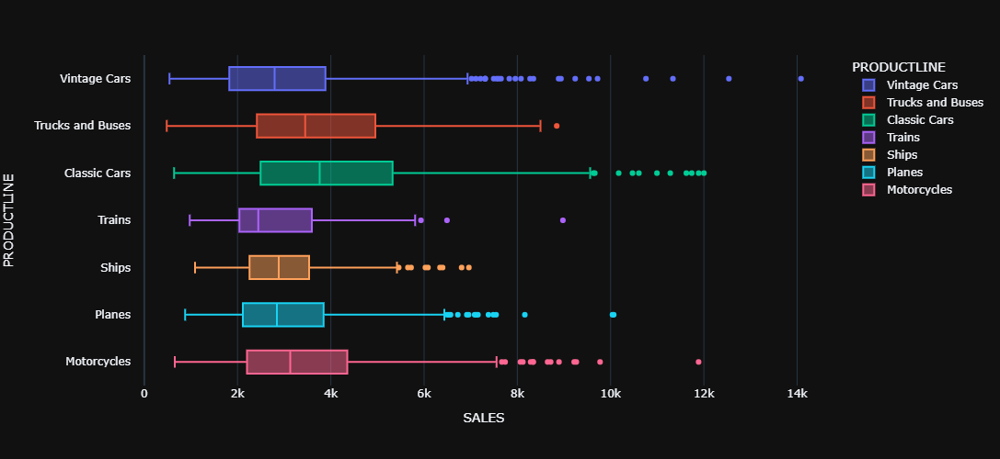

In [1208]:
fig = px.box(df, x="SALES", y="PRODUCTLINE", color="PRODUCTLINE",
             width=800, height=500)
fig.update_traces(quartilemethod="linear")  # or "inclusive", or "linear" by default
fig.show()

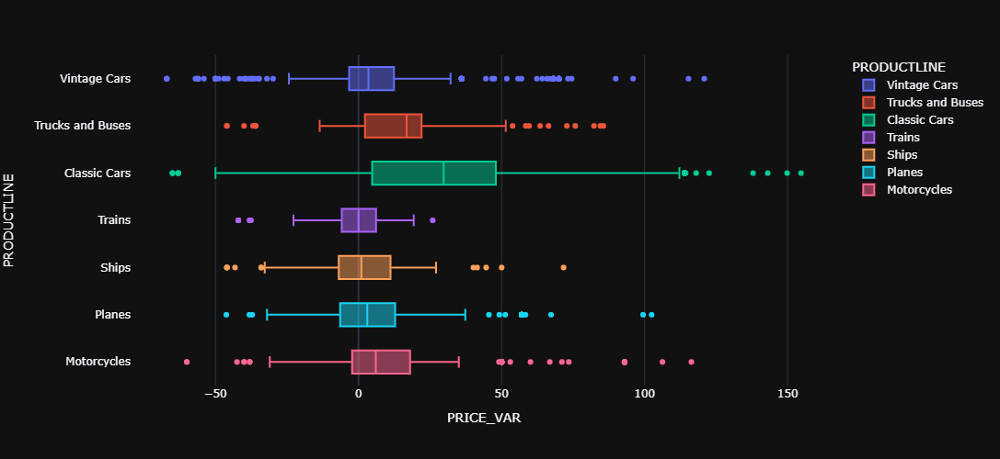

In [1209]:
fig = px.box(df, x="PRICE_VAR", y="PRODUCTLINE", color="PRODUCTLINE",
             width=800, height=500)
fig.update_traces(quartilemethod="linear")  # or "inclusive", or "linear" by default
fig.show()

#### PRODUCTCODE (F)

In [463]:
df[['PRODUCTLINE', 'PRODUCTCODE', 'SALES']].groupby(['PRODUCTLINE', 'PRODUCTCODE']).count()

SALES
PRODUCTLINE  PRODUCTCODE       
Classic Cars S10_1949        28
             S10_4757        27
             S10_4962        28
             S12_1099        25
             S12_1108        26
...                         ...
Vintage Cars S24_3816        26
             S24_3969        22
             S24_4258        26
             S32_4289        24
             S50_1341        26

[109 rows x 1 columns]

In [1215]:
# sns.regplot(x='PRODUCTCODE', y='SALES', data=norm_df)

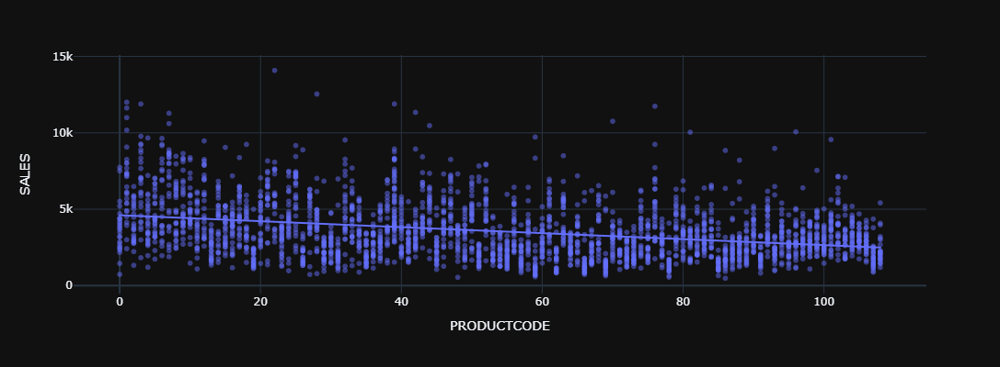

In [1214]:
fig = px.scatter(norm_df, x='PRODUCTCODE', y='SALES', trendline='ols',
                 opacity=0.5,
                 width=600, height=400)
fig.show()

## EDA Visualizations

In [30]:
# sns.axes_style()

In [31]:
# sns.set_context({})

In [1654]:
# g = sns.relplot(
#     data=df, x="YM_ID", y="SALES",
#     hue="DEALSIZE",  # hue="event", style="event",
#     kind="line", aspect=1.3
# )
# g.set_xticklabels(rotation=90, step=1)

In [1658]:
sum_df = pd.DataFrame(columns=['YM_ID2', 'm', 'm-h', 'm+h', 'DEALSIZE'])

for dealsize in list(df.DEALSIZE.unique()):
    ci_dict = df[df['DEALSIZE'] == dealsize].groupby(by='YM_ID2').SALES.apply(mean_confidence_interval).to_dict()
    this_df = pd.DataFrame(data=ci_dict, index=['m', 'm-h', 'm+h'])
    this_df = this_df.transpose()
    this_df.reset_index(inplace=True)
    this_df.rename(columns={'index': 'YM_ID2'}, inplace=True)
    this_df['DEALSIZE'] = dealsize
    sum_df = pd.concat([sum_df, this_df])
sum_df.head(3)

,YM_ID2,m,m-h,m+h,DEALSIZE
0,2003-01-01,4237.152174,3882.710463,4591.593884,Medium
1,2003-02-01,3875.801304,3464.167849,4287.434760,Medium
2,2003-03-01,4455.290000,4030.979569,4879.600431,Medium


In [1649]:
# fig = go.Figure()

# ['none', 'tozeroy', 'tozerox', 'tonexty', 'tonextx', 'toself', 'tonext']
# for dealsize in sum_df.DEALSIZE.sort_values().unique():
#     if dealsize == 'Large':
#         use_color = '#384384'
#     elif dealsize == 'Medium':
#         use_color = '#5a3e84'
#     else:
#         use_color = '#7c3226'
#     fig.add_trace(go.Scatter(x=sum_df.YM_ID2[sum_df.DEALSIZE == dealsize], y=sum_df['m'][sum_df.DEALSIZE == dealsize],
#                              mode='markers+lines',
#                              fill='none',
#                              name=dealsize))
#     fig.add_trace(go.Scatter(x=sum_df.YM_ID2[sum_df.DEALSIZE == dealsize],
#                              y=sum_df['m+h'][sum_df['DEALSIZE'] == dealsize],
#                              mode='lines',
#                              fill='tonextx',
#                              line_color=use_color,
#                              showlegend=False,
#                              name=str(dealsize) + 'm+h'))
#     fig.add_trace(go.Scatter(x=sum_df.YM_ID2[sum_df.DEALSIZE == dealsize],
#                              y=sum_df['m-h'][sum_df['DEALSIZE'] == dealsize],
#                              mode='lines',
#                              fill='tonexty',
#                              line_color=use_color,
#                              showlegend=False,
#                              name=str(dealsize) + ': m-h'))

# fig.update_xaxes(showgrid=True, ticklabelmode="period",
#                  dtick="M1",
#                  tickformat="%b\n'%y",
#                  tickfont_size=10)
# fig.update_yaxes(tickfont_size=10)
# fig.update_layout(legend_title_text='Dealsize', legend_title_side='top', height=600)
# fig.show()

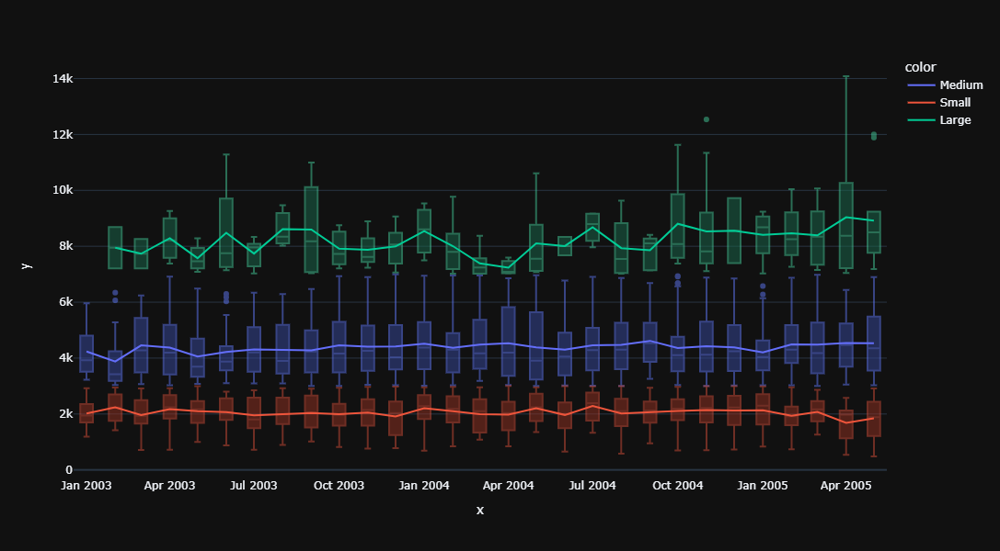

In [1647]:
fig = px.line(x=sum_df.YM_ID2, y=sum_df['m'],
              # facet_row=sum_df.DEALSIZE,
              color=sum_df.DEALSIZE,
              # error_y=sum_df['m+h'], error_y_minus=sum_df['m-h'],
              height=600)

for dealsize in df.DEALSIZE.sort_values().unique():
    if dealsize == 'Medium':
        lcolor = '#5f77f7'
        fcolor = '#37489e'
    elif dealsize == 'Small':
        lcolor = '#cc4a36'
        fcolor = '#943021'
    else:
        lcolor = '#42cb99'
        fcolor = '#19694c'
    fig.add_trace(go.Box(x=df['YM_ID2'][df.DEALSIZE == dealsize],
                         y=df['SALES'][df.DEALSIZE == dealsize],
                         fillcolor=fcolor, line_color=lcolor, opacity=.5,
                         showlegend=False))
fig.show()

### DEALSIZE vs MSRP

MSRP for DEALSIZE=Large have variation post 2004-10
> Which is mostly caused by MSRP changes from Vintage and Classic cars having a larger sales volume than the other PRODUCTLINEs

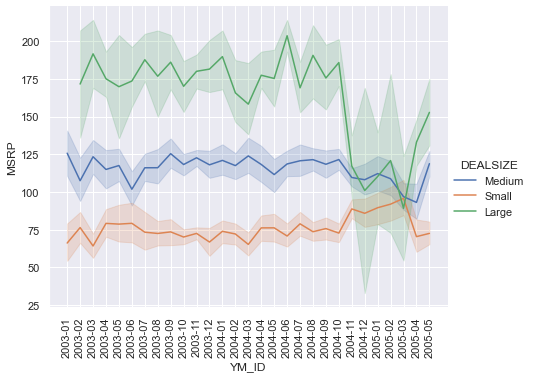

In [444]:
g = sns.relplot(
    data=df, x="YM_ID", y="MSRP",
    hue="DEALSIZE",  # hue="event", style="event",
    kind="line", aspect=1.3
)
g.set_xticklabels(rotation=90, step=1)

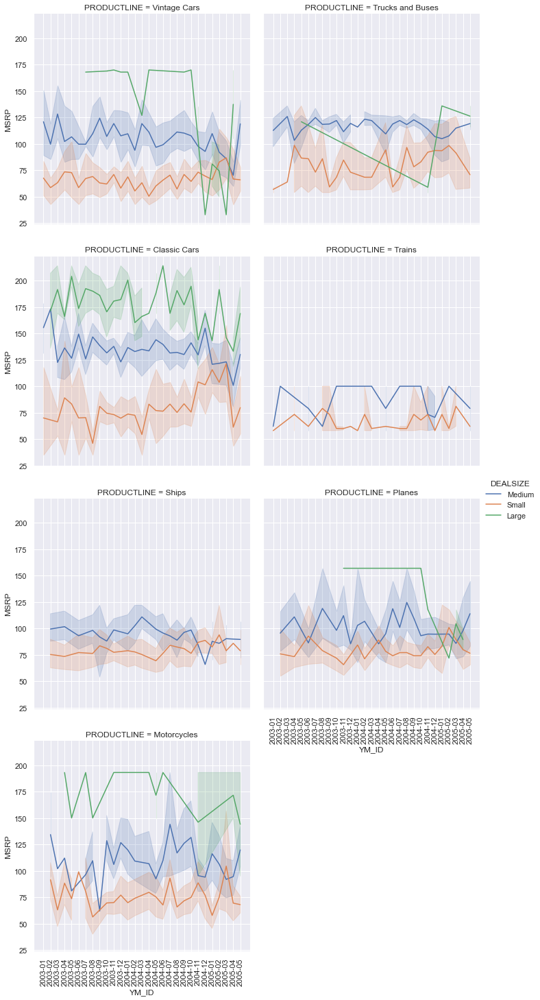

In [452]:
g = sns.relplot(
    data=df, x="YM_ID", y="MSRP",
    hue="DEALSIZE", col="PRODUCTLINE", col_wrap=2,
    kind="line", aspect=1
)
g.set_xticklabels(rotation=90, step=1)

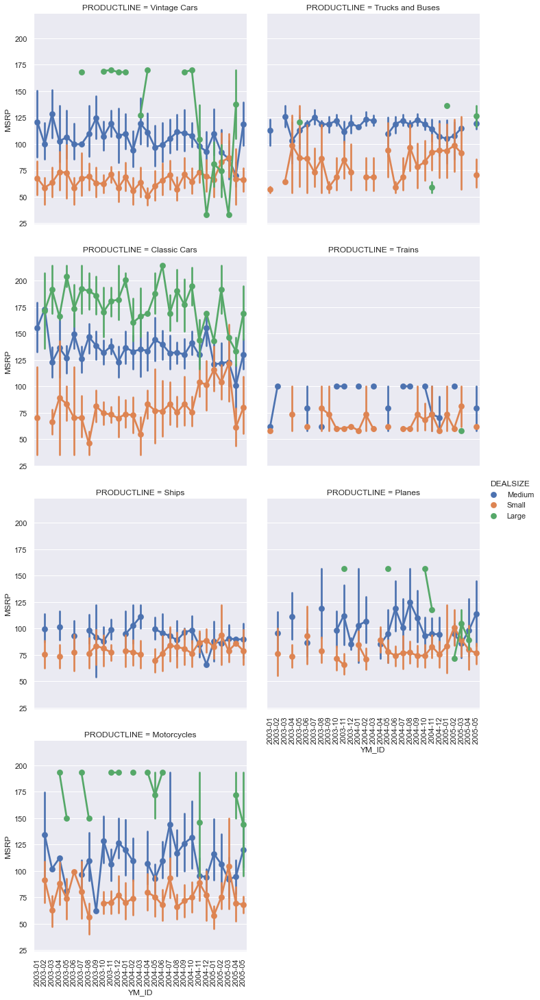

In [455]:
g = sns.catplot(
    data=df, x="YM_ID", y="MSRP",
    hue="DEALSIZE", col="PRODUCTLINE", col_wrap=2,
    kind="point", aspect=1
)
g.set_xticklabels(rotation=90, step=1)

### DEALSIZE vs PRICEEACH

* DEALSIZE: Large typically remain at a constant level
* DEALSIZE: Small varies more than Medium deals

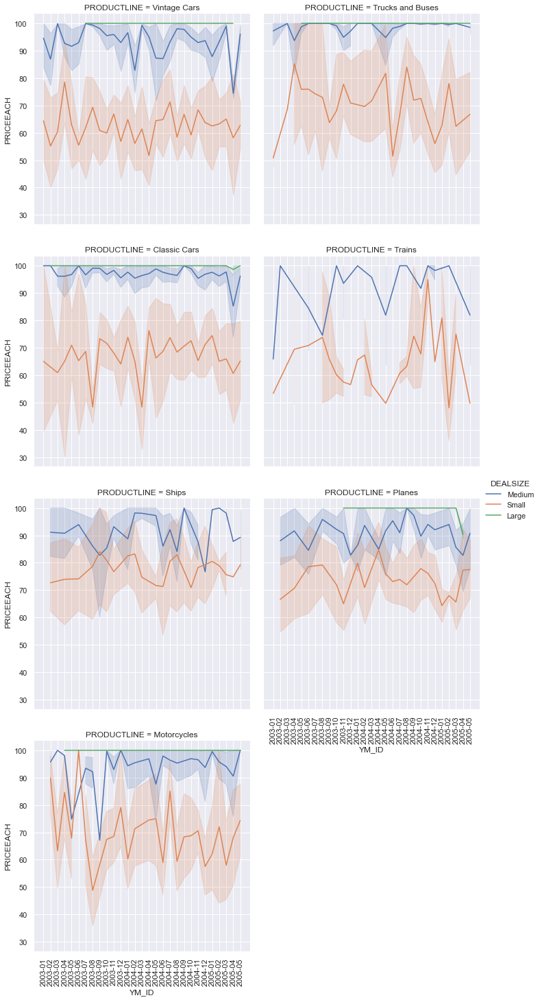

In [448]:
g = sns.relplot(
    data=df, x="YM_ID", y="PRICEEACH",
    hue="DEALSIZE", col="PRODUCTLINE", col_wrap=2,
    kind="line", aspect=1
)
g.set_xticklabels(rotation=90, step=1)